In [2]:
import pandas as pd
import networkx as nx
from collections import Counter
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

In [3]:
# read in data

drugs_se = pd.read_csv("data/heart_drugs_with_heart_se.csv")
drugs_target = pd.read_csv("data/heart_drugs_targets.csv")

# Drug-SE Graphs

In [4]:
# format edges

drugs_se['edge'] = [(drugs_se['drug_name'][e], drugs_se['side_effect_name'][e]) for e in range(len(drugs_se))]

In [5]:
# function to draw drug - se graph based on df with drug_name, side_effect_name, and edges

def draw_bipartite_graph(df, title=""):
    G = nx.Graph()
    
    # add bipartite nodes
    drugs = df[list(df)[0]].unique()
    se = df[list(df)[1]].unique()
    edges = df['edge']
    
    G.add_nodes_from(drugs, bipartite=0)
    G.add_nodes_from(se, bipartite=1)
    
    # add edges
    G.add_edges_from(edges)
    
    # create color_dict
    color_dict = {}
    for d in range(len(drugs)):
        color_dict[drugs[d]] = sns.color_palette("hls", len(drugs))[d]
    
    # set colors
    edge_colors = []
    for pair in G.edges:
        edge_colors.append(color_dict[pair[0]])
    
#     # sanity check
#     assert nx.is_connected(G)
    
    # plot graph
    bottom_nodes, top_nodes = drugs, se
    
    top = bottom_nodes
    pos = nx.bipartite_layout(G, top)
    
    plt.figure(figsize=(10, 10)) 
    plt.title(title)
    nx.draw(G, pos=pos, with_labels=True, edge_color=edge_colors)
    return G

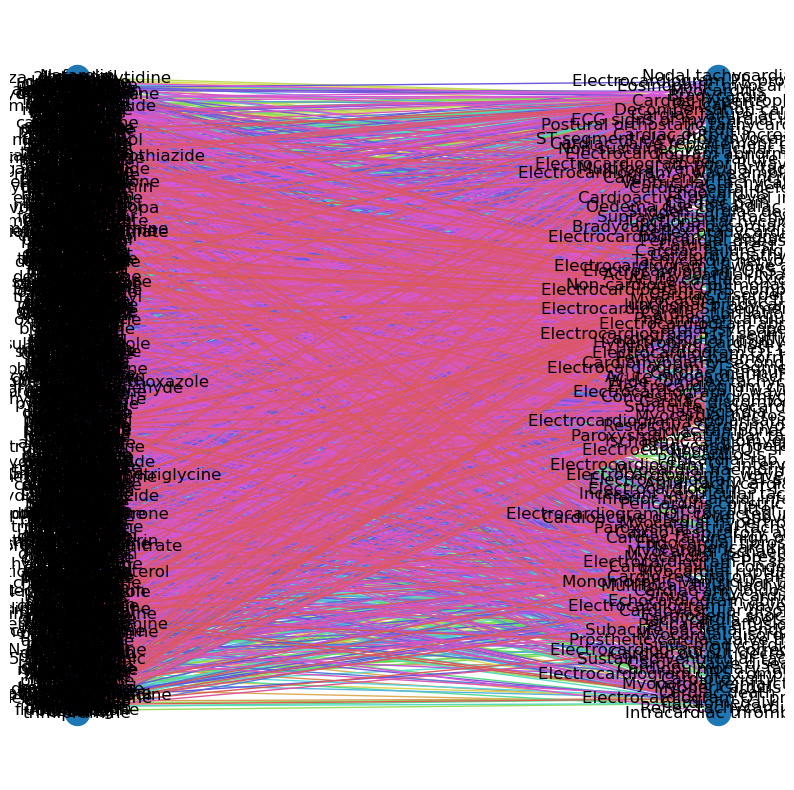

In [6]:
draw_bipartite_graph(drugs_se)

## Trying again but with a smaller number of ADEs

In [157]:
len(drugs_se.side_effect_name.unique())

132

In [7]:
# 10 most common heart side effects

Counter(drugs_se.side_effect_name).most_common(10)

[('Tachycardia', 577),
 ('Cardiac disorder', 411),
 ('Bradycardia', 356),
 ('Myocardial infarction', 321),
 ('Cardiac arrest', 230),
 ('Cardiac failure', 216),
 ('Cardiac failure congestive', 197),
 ('Ventricular tachycardia', 141),
 ('Cardiovascular disorder', 120),
 ('Myocardial ischaemia', 117)]

In [8]:
# most common keys
top_ten_common_se = [k[0] for k in Counter(drugs_se.side_effect_name).most_common(10)]

top_ten_common_drugs_se = drugs_se[drugs_se['side_effect_name'].isin(top_ten_common_se)]

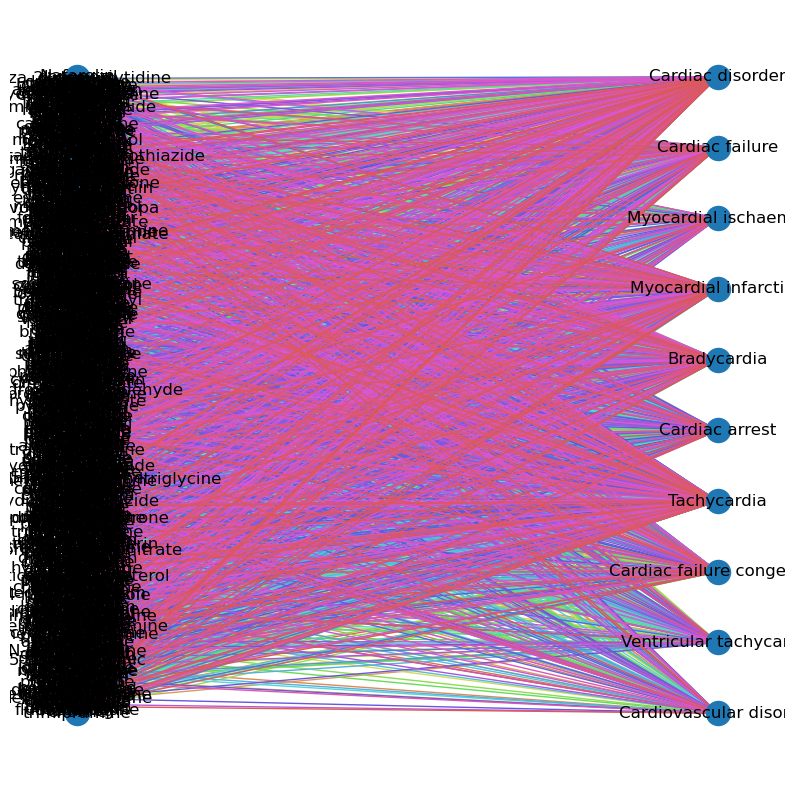

In [9]:
draw_bipartite_graph(top_ten_common_drugs_se)

## Trying again but with a smaller number of ADEs and smaller number of drugs

In [10]:
# 20 drugs with most heart side effects

Counter(drugs_se.drug_name).most_common(20)

[('tacrolimus', 24),
 ('aripiprazole', 24),
 ('pregabalin', 23),
 ('cyclophosphamide', 22),
 ('risperidone', 21),
 ('bortezomib', 21),
 ('doxorubicin', 20),
 ('ifosfamide', 19),
 ('mycophenolate', 18),
 ('anthracycline', 17),
 ('memantine', 17),
 ('propafenone', 17),
 ('citalopram', 16),
 ('dasatinib', 16),
 ('clomipramine', 15),
 ('ioversol', 15),
 ('quetiapine', 15),
 ('dipyridamole', 14),
 ('fluvoxamine', 14),
 ('iopamidol', 14)]

In [11]:
# most common keys

top_ten_drugs = [k[0] for k in Counter(drugs_se.drug_name).most_common(10)]

top_ten_drugs_top_ten_se = top_ten_common_drugs_se[top_ten_common_drugs_se['drug_name'].isin(top_ten_drugs)]

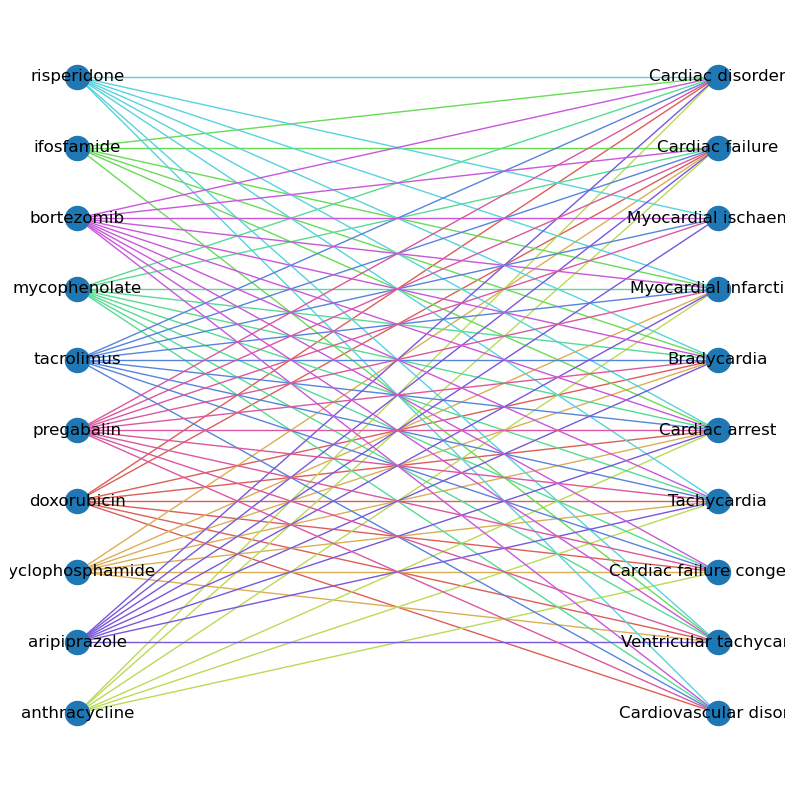

In [12]:
top_10 = draw_bipartite_graph(top_ten_drugs_top_ten_se)

In [13]:
# function to label with node degree

def label_node_deg(G, title=""):
    for node in G.nodes():
        d = G.degree(node)
        mapping = {node: node + ' \n ' + str(d)}
        G = nx.relabel_nodes(G, mapping)
    
    drugs = list(nx.bipartite.sets(G)[0])
        
    # create color_dict
    color_dict = {}
    for d in range(len(drugs)):
        color_dict[drugs[d]] = sns.color_palette("hls", len(drugs))[d]
    
    # set colors
    edge_colors = []
    for pair in G.edges:
        edge_colors.append(color_dict[pair[0]])
        
    # plot graph
    bottom_nodes, top_nodes = nx.bipartite.sets(G)
    
    top = nx.bipartite.sets(G)[0]
    pos = nx.bipartite_layout(G, top)
    
    plt.figure(figsize=(10, 10)) 
    plt.title(title)    
    nx.draw(G, pos=pos, with_labels=True, edge_color=edge_colors, font_size=9)
    return G
    
    

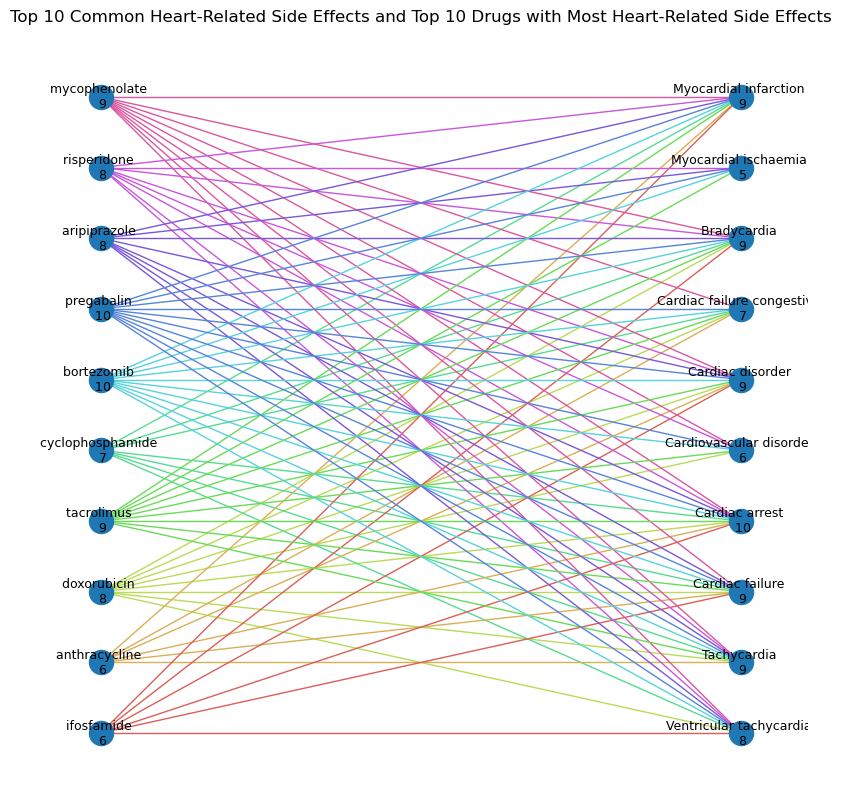

In [14]:
label_node_deg(top_10, "Top 10 Common Heart-Related Side Effects and Top 10 Drugs with Most Heart-Related Side Effects")


# TODO : project graph to drug - drug and se - se

# Drug - Drug Graphs

In [15]:
# create drug - target network first then project into a drug - drug network

dt = drugs_target[['drug_name', 'target_name']]

dt['edge'] = [(dt['drug_name'][e], dt['target_name'][e]) for e in range(len(dt))]

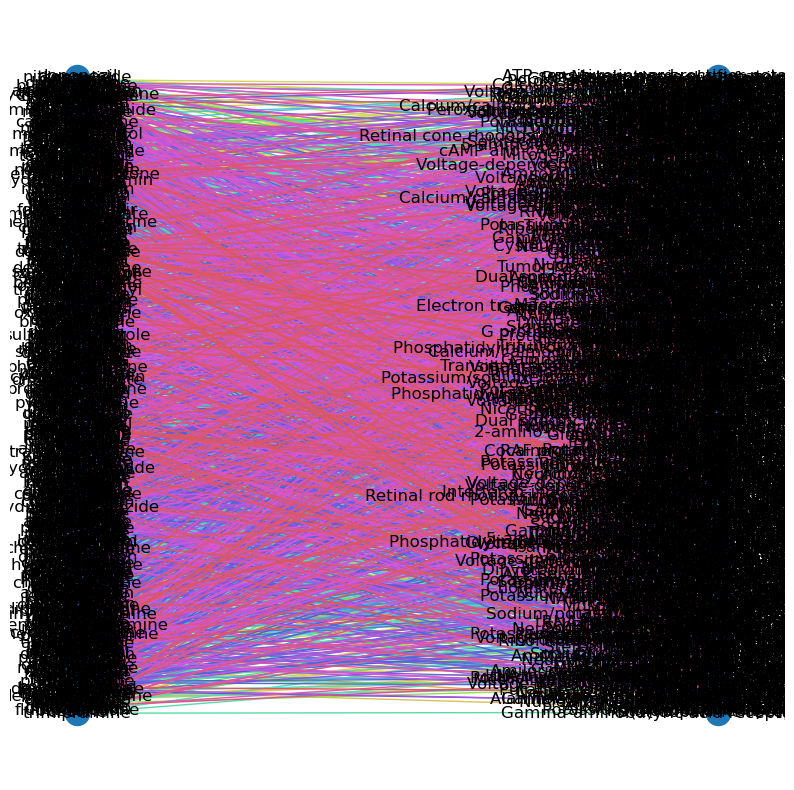

In [16]:
draw_bipartite_graph(dt)

## Trying again but with a smaller number of drugs (10)

In [17]:
# top 10 drugs with the most se

top_ten_drugs

['tacrolimus',
 'aripiprazole',
 'pregabalin',
 'cyclophosphamide',
 'risperidone',
 'bortezomib',
 'doxorubicin',
 'ifosfamide',
 'mycophenolate',
 'anthracycline']

In [18]:
top_10_drugs_dt = dt[dt['drug_name'].isin(top_ten_drugs)]

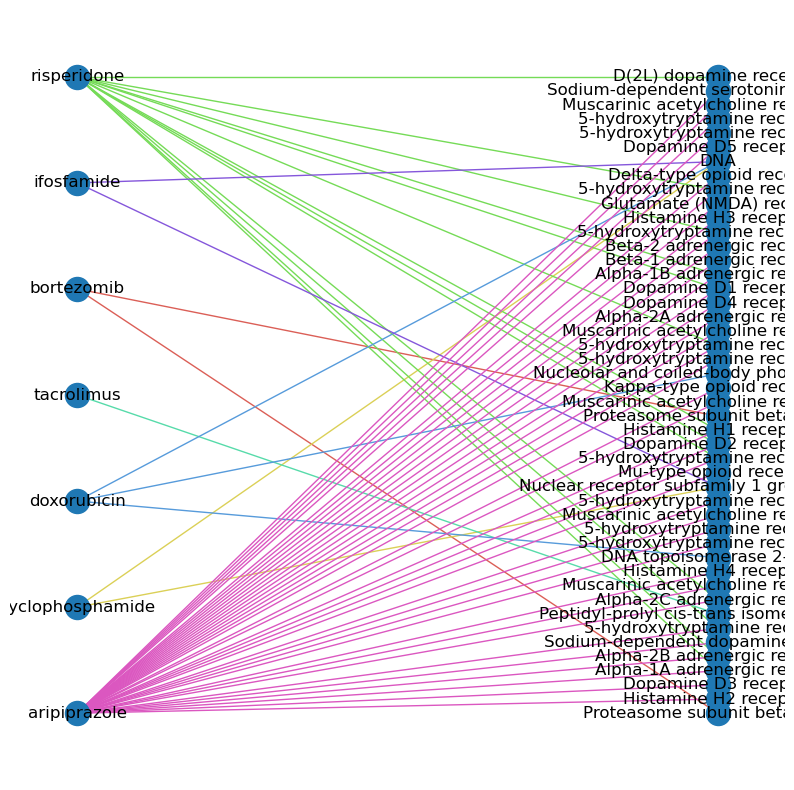

In [19]:
top_10_dt = draw_bipartite_graph(top_10_drugs_dt)

In [89]:
# function to project drug - target network to drug - drug network

def project_drug_target(G, drugs, with_labels=True):
    projected = nx.bipartite.weighted_projected_graph(G, drugs)
    
    pos=nx.nx_agraph.graphviz_layout(projected)
    
    # draw projected drug-drug graphs
    nx.draw(projected, with_labels=with_labels, pos=pos, font_size=9)

    # add weights between drugs
    labels = nx.get_edge_attributes(projected, 'weight')
    nx.draw_networkx_edge_labels(projected, pos=pos, edge_labels=labels, font_size=6);
    
    return projected

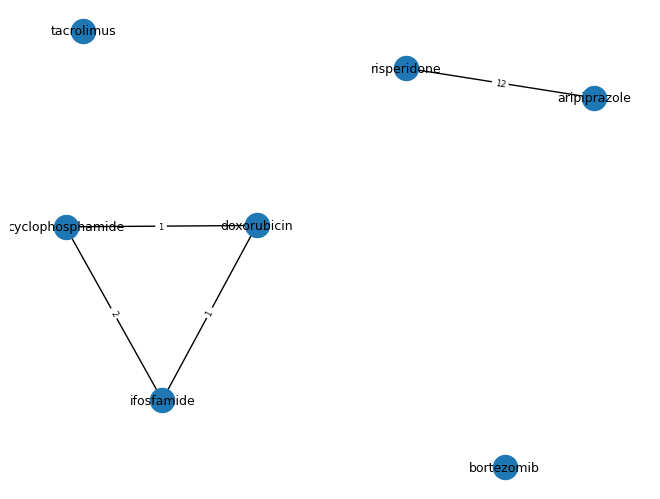

In [21]:
project_drug_target(top_10_dt, top_10_drugs_dt.drug_name.unique())

## Trying again but with a slightly larger number of drugs (20)

In [22]:
# top 20 drugs with the most se

top_twenty_drugs = [k[0] for k in Counter(drugs_se.drug_name).most_common(20)]
top_20_drugs_dt = dt[dt['drug_name'].isin(top_twenty_drugs)]

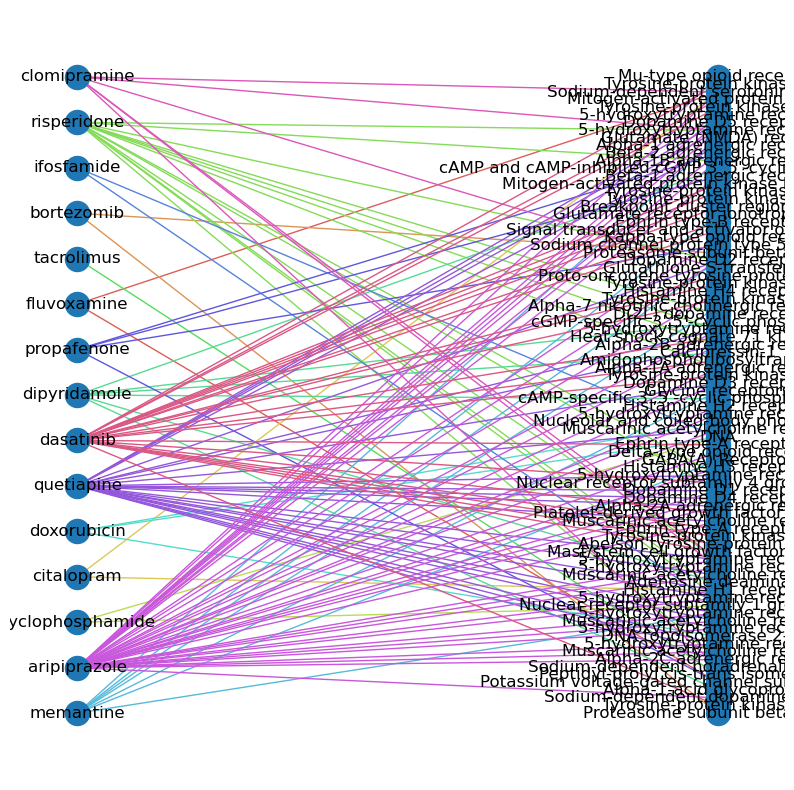

In [23]:
top_20_dt = draw_bipartite_graph(top_20_drugs_dt)

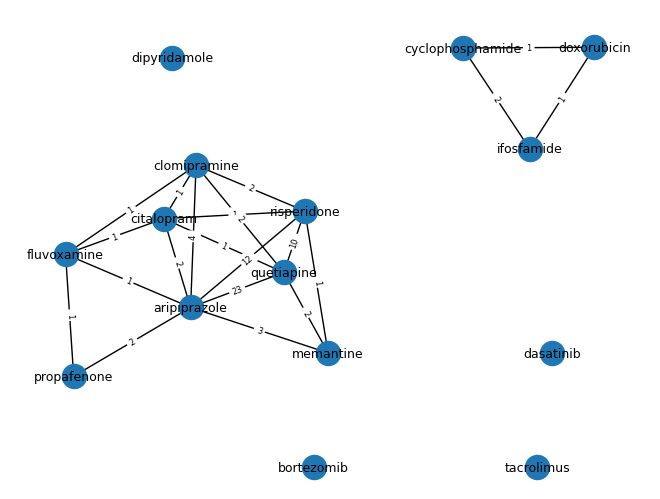

In [24]:
project_drug_target(top_20_dt, top_20_drugs_dt.drug_name.unique())

### with all drugs


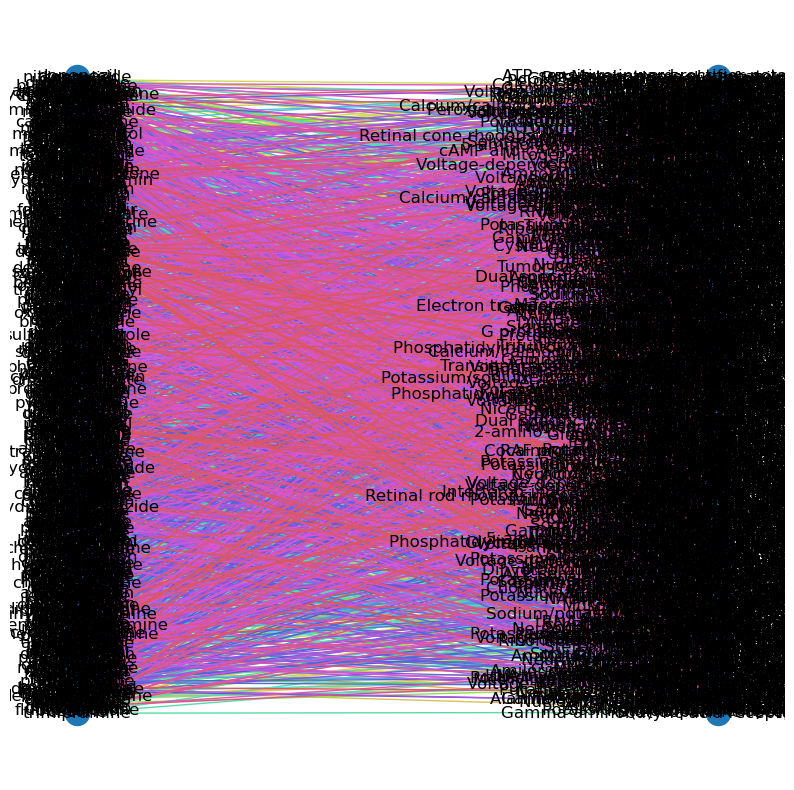

In [25]:
top_dt = draw_bipartite_graph(dt)

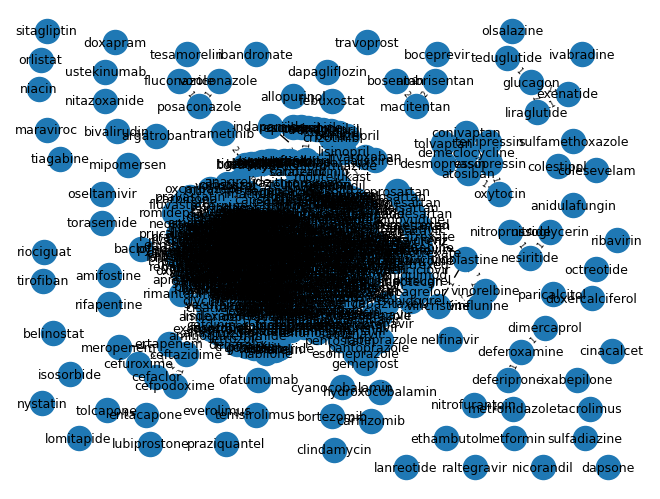

In [29]:
project_drug_target(top_dt, dt.drug_name.unique())

In [30]:
len(dt)

6713

In [33]:
len(dt.drug_name.unique())

664

# TODO: label by color what year drugs were approved

# TODO: change weights to type of moderation not just target name

In [44]:
top_targets = Counter(drugs_target.action).most_common(10)
t = [t[0] for t in top_targets]

In [40]:
drugs_target.head()

,drug_name,target_name,restrictions,action
0,bivalirudin,Prothrombin,"approved,investigational",inhibitor
1,goserelin,Lutropin-choriogonadotropic hormone receptor,approved,agonist
2,goserelin,Gonadotropin-releasing hormone receptor,approved,agonist
3,desmopressin,Vasopressin V2 receptor,approved,agonist
4,desmopressin,Vasopressin V1a receptor,approved,agonist


In [74]:
dt_action = drugs_target[['drug_name', 'target_name', 'action']]
dt_action['target'] = [dt_action['target_name'][d] + " " + dt_action['action'][d] for d in range(len(dt_action))]
dt_action_top = dt_action[dt_action["action"].isin(t)]



In [75]:
dt_action_top

,drug_name,target_name,action,target
0,bivalirudin,Prothrombin,inhibitor,Prothrombin inhibitor
1,goserelin,Lutropin-choriogonadotropic hormone receptor,agonist,Lutropin-choriogonadotropic hormone receptor a...
2,goserelin,Gonadotropin-releasing hormone receptor,agonist,Gonadotropin-releasing hormone receptor agonist
3,desmopressin,Vasopressin V2 receptor,agonist,Vasopressin V2 receptor agonist
4,desmopressin,Vasopressin V1a receptor,agonist,Vasopressin V1a receptor agonist
...,...,...,...,...
6705,vinflunine,Tubulin beta chain,inhibitor,Tubulin beta chain inhibitor
6706,tropisetron,5-hydroxytryptamine receptor 3A,antagonist,5-hydroxytryptamine receptor 3A antagonist
6708,lormetazepam,GABA(A) Receptor,ligand,GABA(A) Receptor ligand
6710,lormetazepam,GABA(A) Receptor Benzodiazepine Binding Site,ligand,GABA(A) Receptor Benzodiazepine Binding Site l...


In [77]:
dt_action_top.reset_index(inplace=True)

In [78]:
dt_action_top['edge'] = [(dt_action_top['drug_name'][e], \
                          dt_action_top['target'][e]) for e in range(len(dt_action_top))]

In [79]:
dt_action_top = dt_action_top.drop('index', axis=1)

In [81]:
dt_action_top = dt_action_top.drop('action', axis=1)

In [82]:
dt_action_top = dt_action_top.drop('target_name', axis=1)

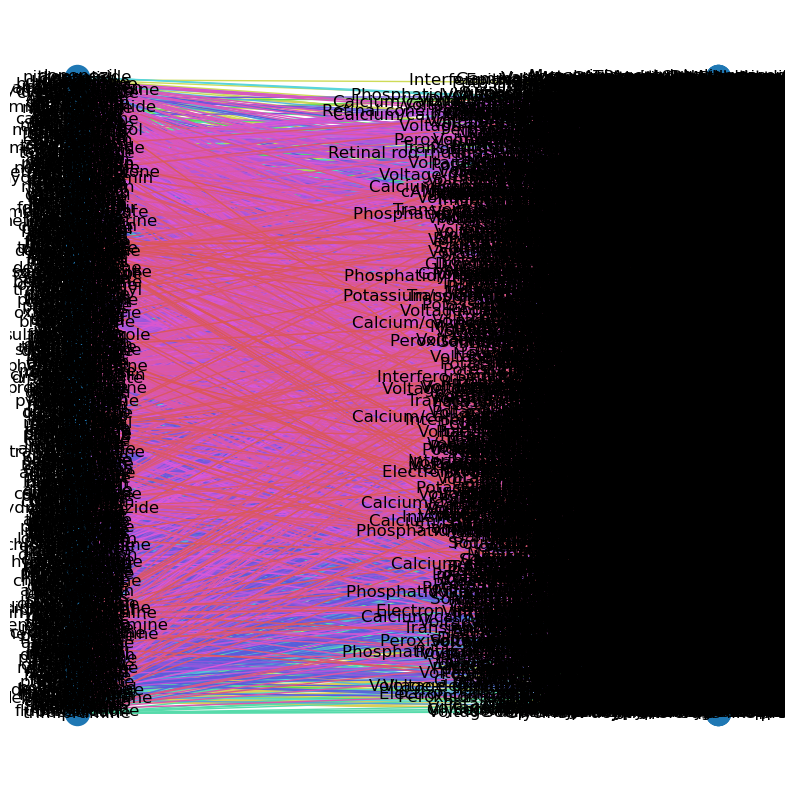

In [83]:
top_dt = draw_bipartite_graph(dt_action_top)

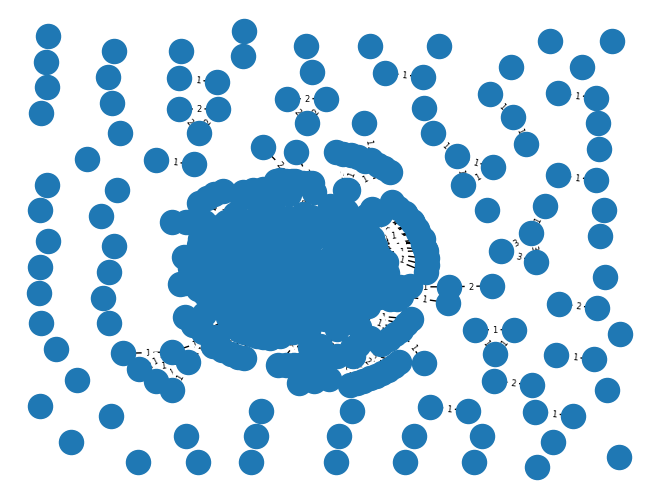

In [90]:
project_drug_target(top_dt, dt_action_top.drug_name.unique(), False)

In [91]:
dt_grouped = dt_action_top.groupby('target', as_index=False).agg({"edge": len})

In [102]:
common_targets = dt_grouped[dt_grouped["edge"]>5]['target']

In [106]:
dt_common_targets = dt_action_top[dt_action_top['target'].isin(common_targets)]

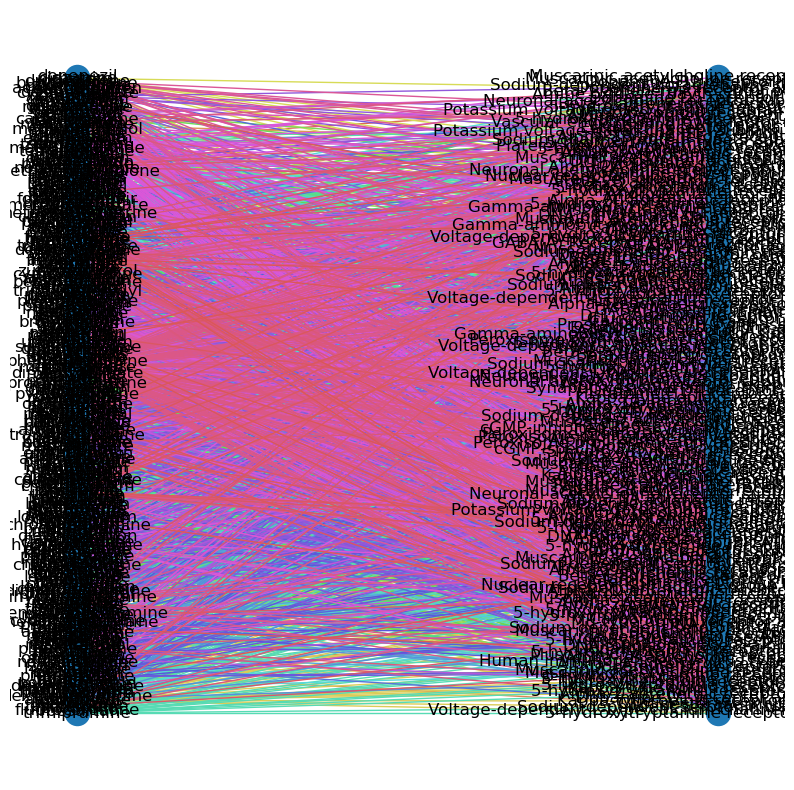

In [107]:
common_targets_dt = draw_bipartite_graph(dt_common_targets)

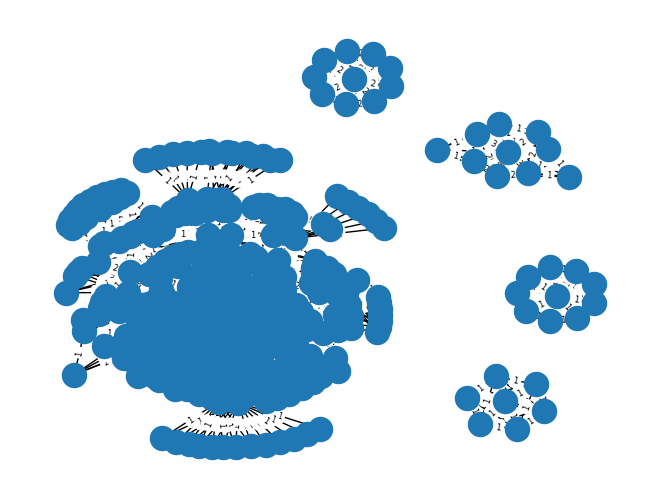

In [140]:
pg = project_drug_target(common_targets_dt, dt_common_targets.drug_name.unique(), False)

In [113]:
len(list(nx.connected_components(common_targets_dt)))

5

## looking at percent ADEs per group

In [142]:
drug_cluster = {}

for i, target_set in enumerate(nx.connected_components(pg)):
    drug_cluster[i] = list(target_set)
    
def return_class(drug):
    for i in range(5):
        if drug in drug_cluster[i]:
            return i
        
dt_common_targets['group'] = [return_class (t) for t in dt_common_targets.drug_name]

In [160]:
percent_ade_df = pd.merge(dt_common_targets[['drug_name', 'group']], drugs_se[['drug_name', 'side_effect_name']], on='drug_name', how='left')

In [169]:
percent_ade_df

,drug_name,group,side_effect_name
0,pravastatin,0,Cardiac disorder
1,pravastatin,0,Myocardial infarction
2,pravastatin,0,Cardiac pain
3,fluvoxamine,0,Cardiovascular disorder
4,fluvoxamine,0,Cardiac arrest
...,...,...,...
15333,candesartan,1,Cardiac arrest
15334,candesartan,1,Myocardial infarction
15335,candesartan,1,Tachycardia
15336,candesartan,1,Cardiac failure


<AxesSubplot: xlabel='side_effect_name', ylabel='count'>

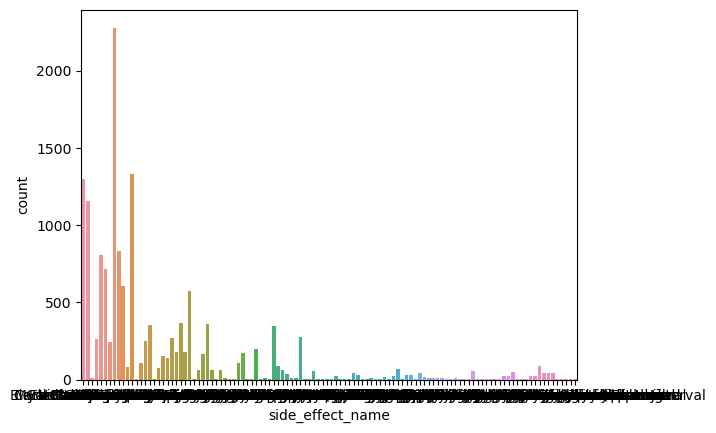

In [170]:
sns.countplot(data=percent_ade_df, x='side_effect_name')

In [235]:
for i in range(5):
    print(i//3, i%3)

0 0
0 1
0 2
1 0
1 1


In [ ]:
side_effects

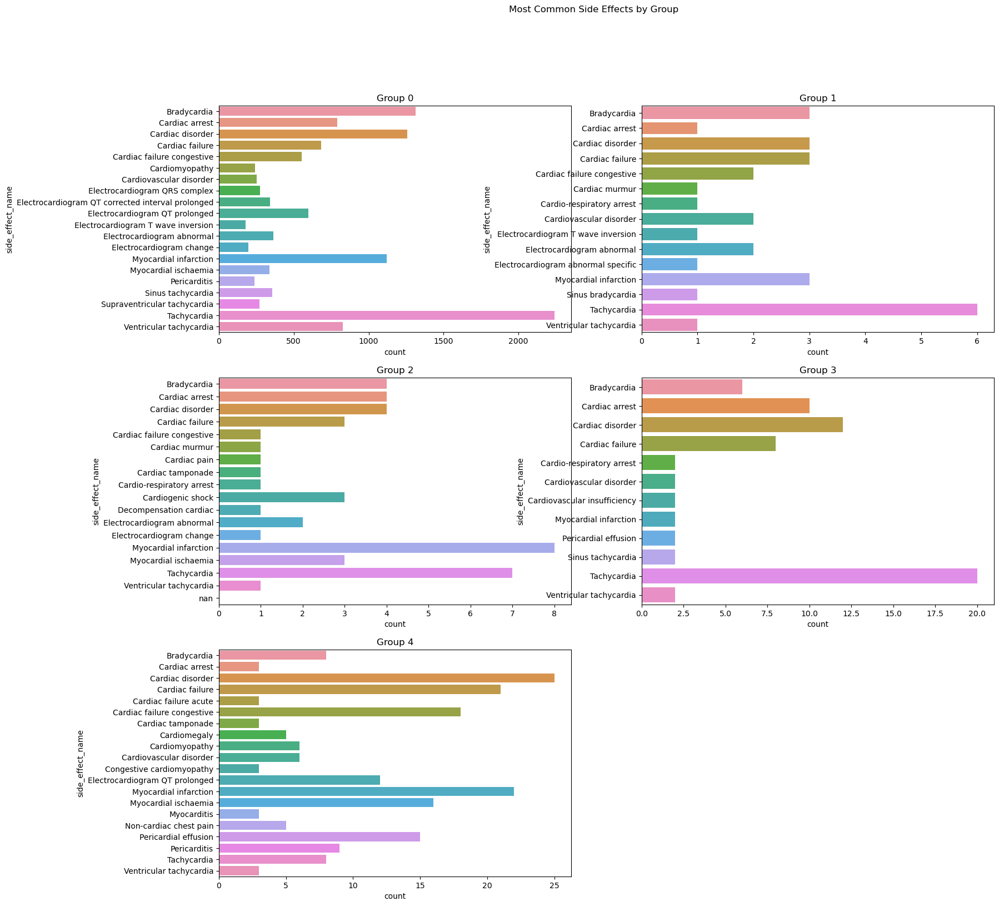

In [245]:
# plot frequencies of 20 most common ADEs for each group
mc = 20

fig, axes = plt.subplots(3, 2, figsize=(18, 18))
axes[2][1].set_visible(False)
fig.suptitle('Most Common Side Effects by Group')

for group in range(5):
    s = percent_ade_df[percent_ade_df["group"] == group]
    s_count = [i[0] for i in Counter(s.side_effect_name).most_common(mc)]
    order = sorted(s_count, key=lambda e: (type(e) is float, e))
    top_s_se = s[s['side_effect_name'].isin(s_count)]

    sns.countplot(ax = axes[group//2, group%2], data=top_s_se, y='side_effect_name', order=order).set(title='Group ' + str(group));